In [1]:
from pathlib import Path
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import cv2
import sys
sys.path.append("..")
from visualization import denormalize, visualize_triplets
from mycode.msls import MSLS, ImagesFromList
from crossmodal.tools.datasets import configure_transform

# Download MSLS sample

In [2]:
SAMPLE_CITIES_TEST = "3"
SAMPLE_CITIES_TRAIN = "0"
root_dir = Path('/data-lyh/').absolute()
print(root_dir)

/data-lyh



# Load dataset for testing


In [3]:
# get transform
meta = {'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225]}
transform = configure_transform(image_dim = (512, 1024), meta = meta)
# positive are defined within a radius of 25 m
posDistThr = 20 #25
negDistThr = 40 
# get validation data, there is no shuffle operation which means that the query data will follow the order recorded in csv file
val_dataset = MSLS(root_dir, cities=SAMPLE_CITIES_TEST, nNeg=5, transform=transform, 
                   mode='val', posDistThr=posDistThr, negDistThr=negDistThr, threads=8, batch_size=2)
# get images
print("len(val_dataset.qImages):\t", len(val_dataset.qImages))
print("len(val_dataset.qIdx):\t", len(val_dataset.qIdx))
print("len(val_dataset.dbImages):\t", len(val_dataset.dbImages))
opt = {'batch_size': 2}
# note that the dataset here is not the validation dataset actually used!
qLoader = DataLoader(ImagesFromList(val_dataset.qImages[val_dataset.qIdx], transform), **opt)
dbLoader = DataLoader(ImagesFromList(val_dataset.dbImages, transform), **opt)
qIdx = val_dataset.qIdx
print("qIdx:\t", qIdx[0])
# get positive index (we allow some more slack: default 25 m)
pIdx = val_dataset.pIdx
print("pIdx:\t", pIdx[0])
q_imgs = val_dataset.qImages
print("q_imgs:\t", q_imgs[0])
db_imgs = val_dataset.dbImages
print("db_imgs:\t", db_imgs[0])
# no train no negatives
neg_imgs = val_dataset.nonNegIdx
print("val_dataset.nonNegIdx:\t", neg_imgs)

=====> 2013_05_28_drive_0003_sync
self.qEndPosList:	 [404]
self.dbEndPosList:	 [606]
len(val_dataset.qImages):	 404
len(val_dataset.qIdx):	 404
len(val_dataset.dbImages):	 606
qIdx:	 0
pIdx:	 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
q_imgs:	 /data-lyh/data_2d_pano/2013_05_28_drive_0003_sync/pano/data_rgb/0000000018.png
db_imgs:	 /data-lyh/data_2d_pano/2013_05_28_drive_0003_sync/pano/data_rgb/0000000001.png
val_dataset.nonNegIdx:	 []


/usr/local/lib/python3.8/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Number of batches: 202
Total number of data samples: 404
<class 'torch.Tensor'>
torch.Size([2, 3, 512, 1024])
<class 'torch.Tensor'>
torch.Size([2])
tensor([0, 1])
torch.Size([512, 1024])
torch.Size([512, 1024])


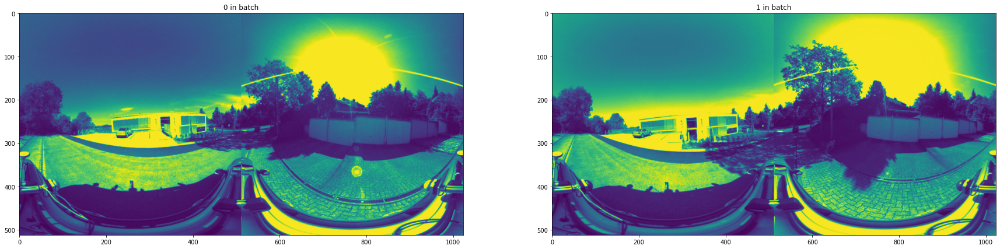

In [4]:
num_batches = len(qLoader)
# Calculate the total number of data samples
total_samples = num_batches * qLoader.batch_size
print("Number of batches:", num_batches)
print("Total number of data samples:", total_samples)
# batch is a brunch of datase in a mini-batch size (qLoader.batch_size), the number of batch is num_batches
#for batch in qLoader:
# print single batch, each batch contains batch_size data, here the data is [3x512x1024] image
x, y = next(iter(qLoader))
print(type(x)) # should be <class 'torch.Tensor'>
print(x.shape) # should be torch.Size([2, 3, 512, 1024])
print(type(y)) # should be <class 'torch.Tensor'>
print(y.shape) # should be torch.Size([2]), corresponding the index inside the batch
print(y) # should be tensor([0, 1])
plt.figure(figsize=(30,20))
for i, im in enumerate(x):
    plt.subplot(1, 2, i + 1)
    print(im[i].shape)
    #print((np.transpose(im[i], (1, 2, 0))).shape)
    #plt.imshow(np.transpose(im[i], (1, 2, 0)))
    plt.imshow(denormalize(im[i])) # color bug
    plt.title(str(i) + " in batch")
plt.show()

len(x) 2
tensor([0, 1])


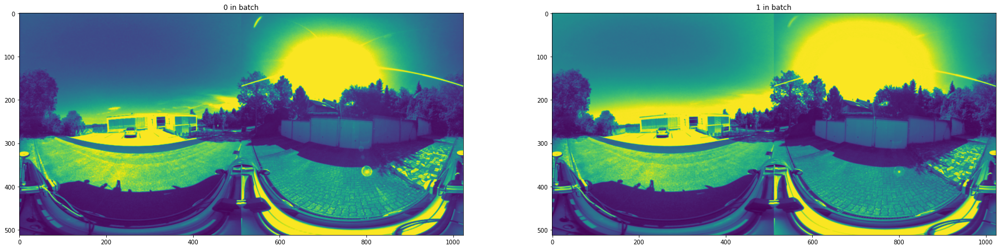

In [5]:
# print single batch, each batch contains batch_size data, here the data is [3x512x1024] image
x, y = next(iter(dbLoader))
print('len(x)',len(x))
print(y)
plt.figure(figsize=(30,20))
for i, im in enumerate(x):
    plt.subplot(1, 2, i+1)
    #plt.imshow(denormalize(im[i]))
    plt.imshow(im[i])
    plt.title(str(i) + " in batch")
plt.show() 

# Load dataset for training (triplets)

In [17]:
posDistThr = 20
# negatives are defined outside a radius of 25 m
negDistThr = 40
# number of negatives per triplet
nNeg = 5
# number of cached queries
cached_queries = 5 # smaller, more subsets
cached_negatives = 100
# choose the cities to load
cities = SAMPLE_CITIES_TRAIN
train_dataset = MSLS(root_dir, cities = cities, transform = transform, mode = 'train',
                    negDistThr = negDistThr, posDistThr = posDistThr, nNeg = nNeg, cached_queries = cached_queries,
                    cached_negatives = cached_negatives)

=====> 2013_05_28_drive_0000_sync
self.qEndPosList:	 [2428]
self.dbEndPosList:	 [8086]


/usr/local/lib/python3.8/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


len(trainDataloader):	 3


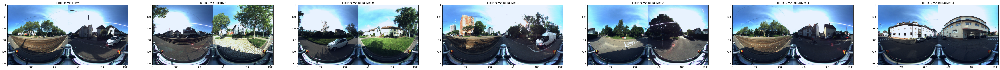

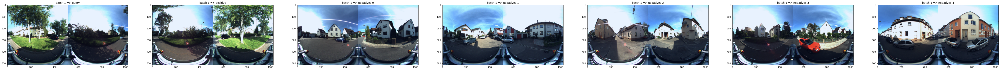

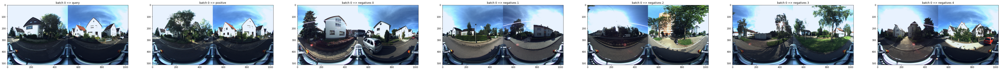

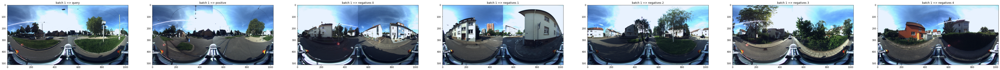

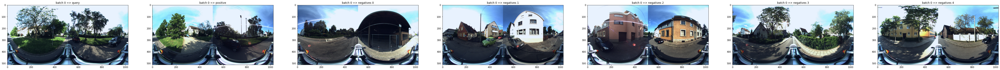

In [19]:
# reset cached subsets
train_dataset.new_epoch()
# creates triplets on the smaller cache set
train_dataset.update_subcache()
# create data loader
opt = {'batch_size': 2, 'shuffle': False}
trainDataloader = DataLoader(train_dataset, **opt)
# visualize a triplet
print("len(trainDataloader):\t", len(trainDataloader))
for batch in trainDataloader:
    visualize_triplets(batch)